<a href="https://colab.research.google.com/github/ellaroberson/Statistics-and-Probability/blob/main/Ella_Lab_7_Lab_Convolution_and_PDE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Never Say Never - Documentary on Belousov–Zhabotinsky Reaction BZ

https://www.youtube.com/watch?v=FvXwVZPOoBI


Image Kernels Explained Visually

https://setosa.io/ev/image-kernels/

In [ ]:
import numpy as np
from skimage import io as io #scikit-image is a collection of algorithms for
#image processing
import matplotlib.pyplot as plt
from scipy import signal
#SciPy is another library for scientific computing signal processing functions.
import torch.nn.functional as F
#This module contains functions that are used to define neural network layers
#and operations, such as activation functions, loss functions, etc.
from torch.nn.functional import *
import torch #imports the main PyTorch library.
import torch.nn as nn #provides support for building neural networks.
import torchvision #provides popular datasets, model architectures
#and image transformations for computer vision tasks.
import torchvision.transforms as transforms
#Transformations are used to preprocess and augment images before feeding
# them into a neural network.
import time #provides various time-related functions
from matplotlib import animation, rc #used to create animations.
from IPython.display import HTML #used to display HTML content
rc('animation', html='html5')

In [ ]:
def make_ani(A, colormap='gray'): # defines the function make_ani with
#two parameters: A gives dimensions and colormap sets the color of the images

    fig, ax = plt.subplots()
    im = ax.imshow(A[0,:,:], cmap = colormap);
    ax.axis('off')
    fig.set_size_inches(12, 12)

    def animate(data, im): #updates the image data (im) with the new frame data (data).
        im.set_data(data)

    def step(): #step generates each frame of the animation.
        for i in range(A.shape[0]):
            data = A[i,:,:] #gives dimensions
            yield data

    return animation.FuncAnimation(fig, animate, step, interval=100, repeat=True, fargs=(im,))

In [ ]:
def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray')
    ax.axis('off')
    fig.set_size_inches(15, 15)
    plt.show()

In [ ]:
image = io.imread("https://www.filfre.net/wp-content/uploads/2013/12/bbc4.png")

In [ ]:
image.shape #RGBa #represents the color

In [ ]:
plot(image) #plots image from html

In [ ]:
image.shape #gives dimensions

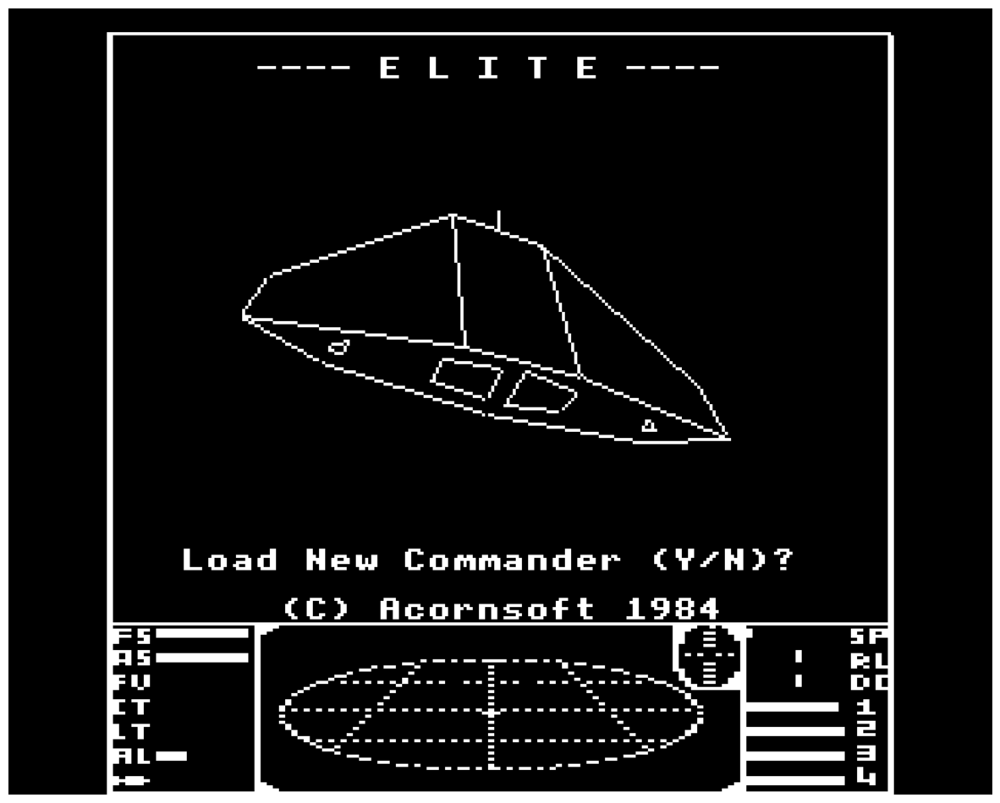

In [145]:
plot(image[:,:,0]) #plots image at 0

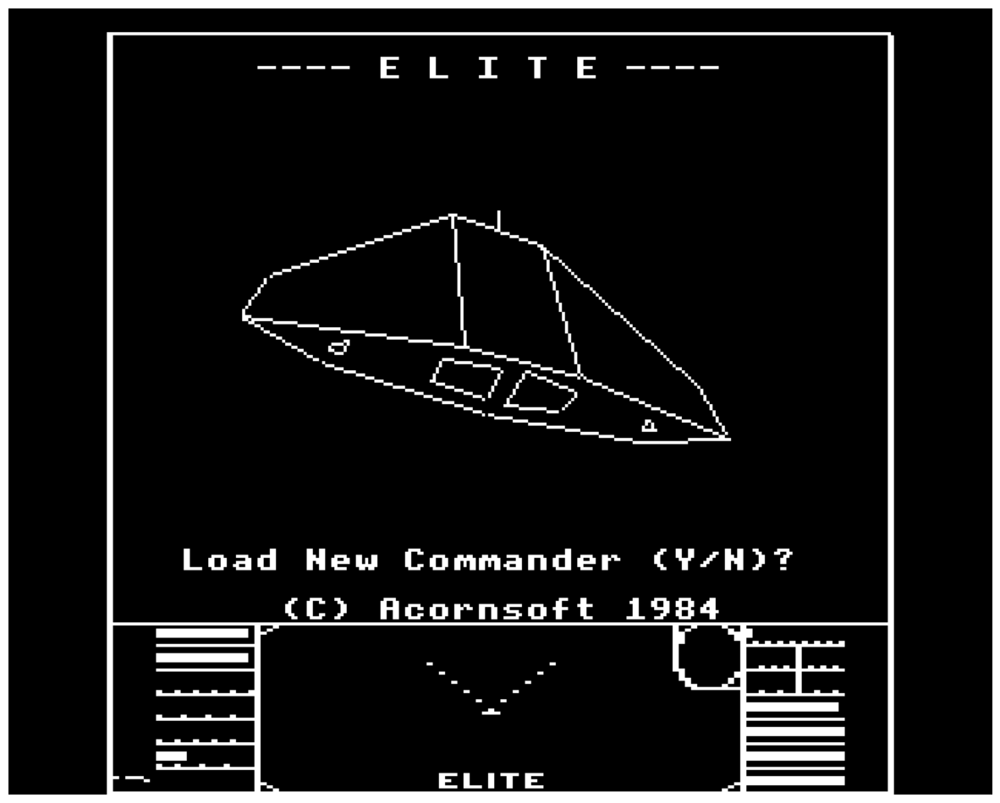

In [146]:
plot(image[:,:,1])

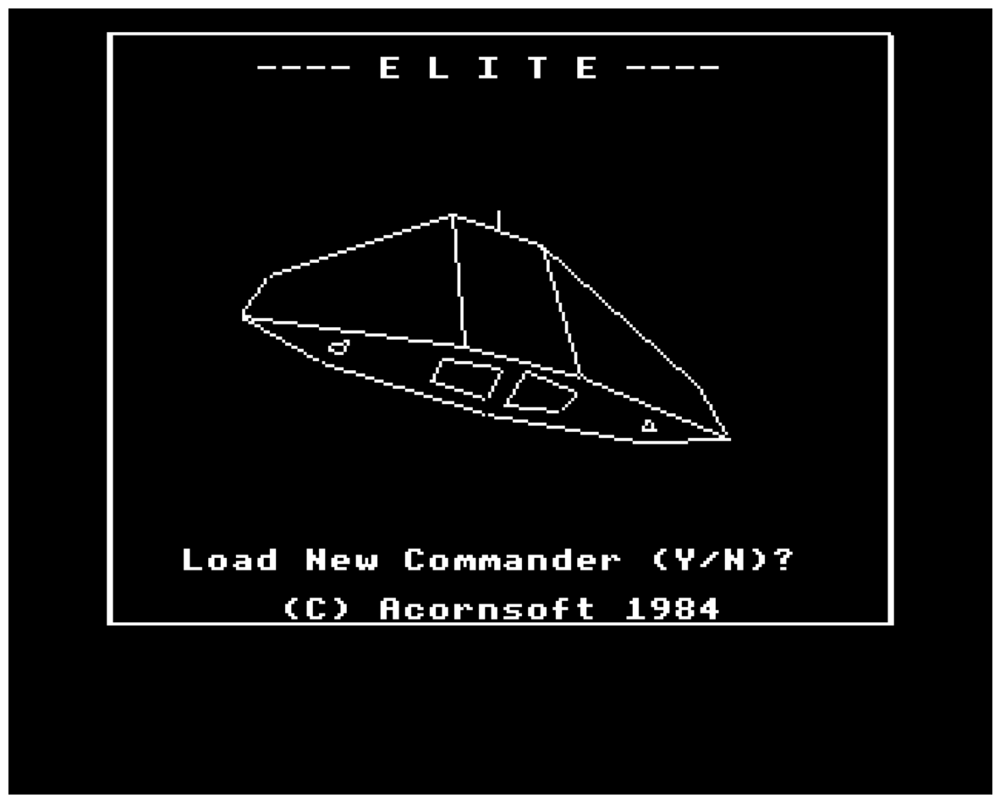

In [147]:
plot(image[:,:,2])

In [148]:
image.shape

(512, 640, 3)

In [149]:
image = np.mean(image, axis=2) #ean of an array or along a specified axis
#NumPy, axes are zero-indexed so axis=2 refers to the third axis,
#which corresponds to the channels axis.

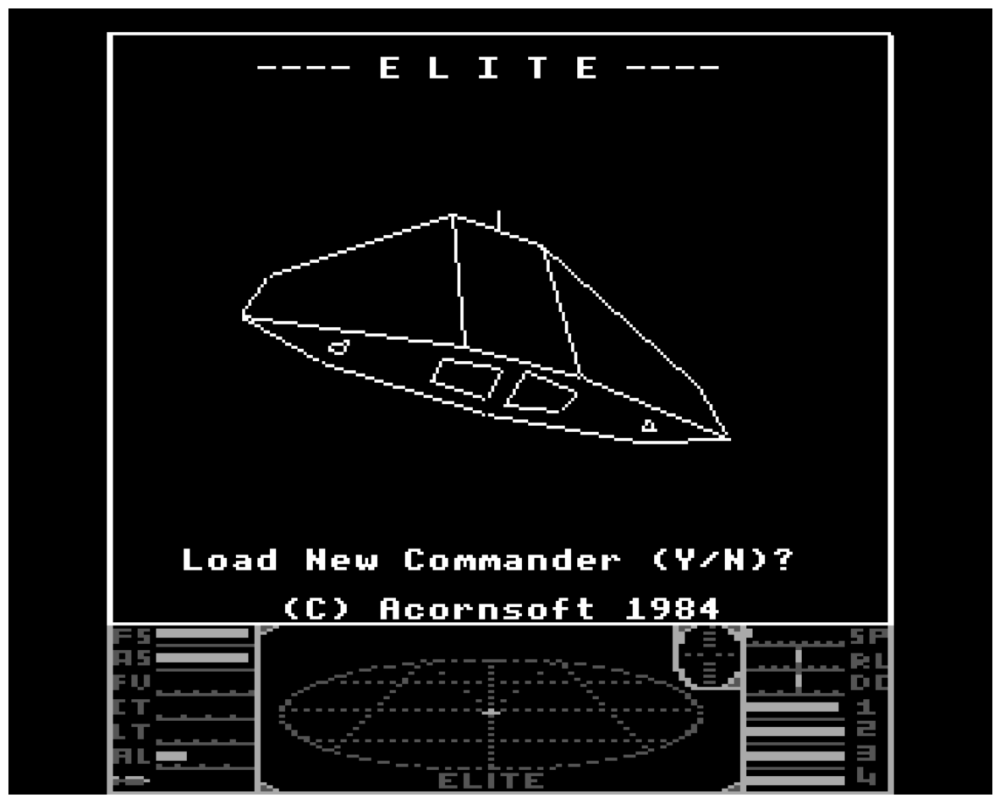

In [150]:
plot(image)

In [151]:
image.shape

(512, 640)

In [152]:
a = np.matrix([[1,2,1],[0,0,0],[-1,-2,-1]])
#creates a 3x3 matrix named

In [153]:
a

matrix([[ 1,  2,  1],
        [ 0,  0,  0],
        [-1, -2, -1]])

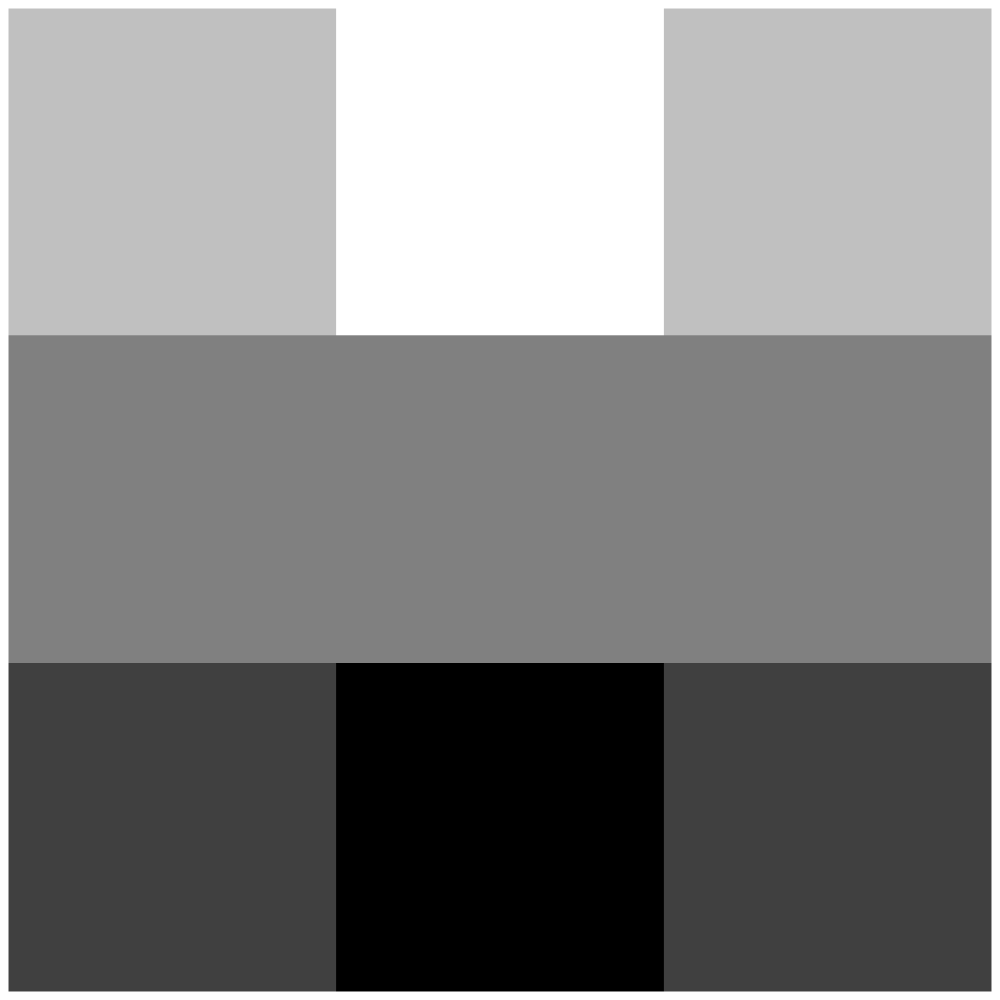

In [154]:
plot(a)

In [155]:
image.shape

(512, 640)

In [156]:
y = signal.convolve2d(image, a, mode='same')
#performs a 2D convolution operation between the input image and the
#filter/kernel matrix

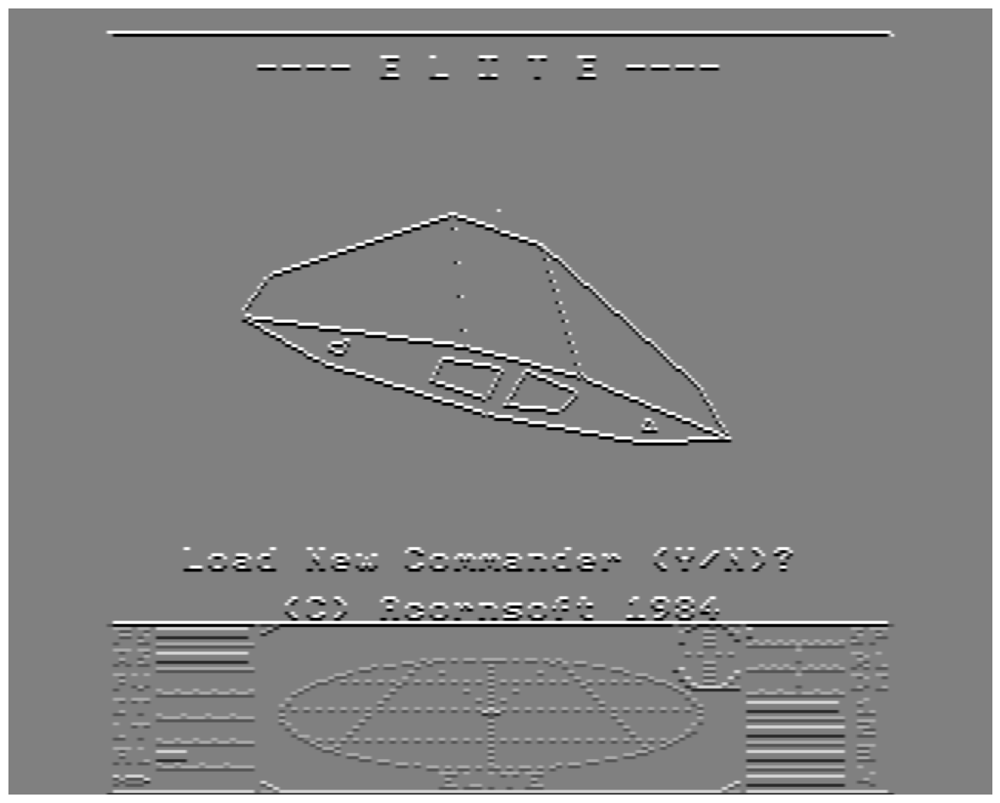

In [157]:
plot(y)

In [158]:
a = np.transpose(a)

In [159]:
a

matrix([[ 1,  0, -1],
        [ 2,  0, -2],
        [ 1,  0, -1]])

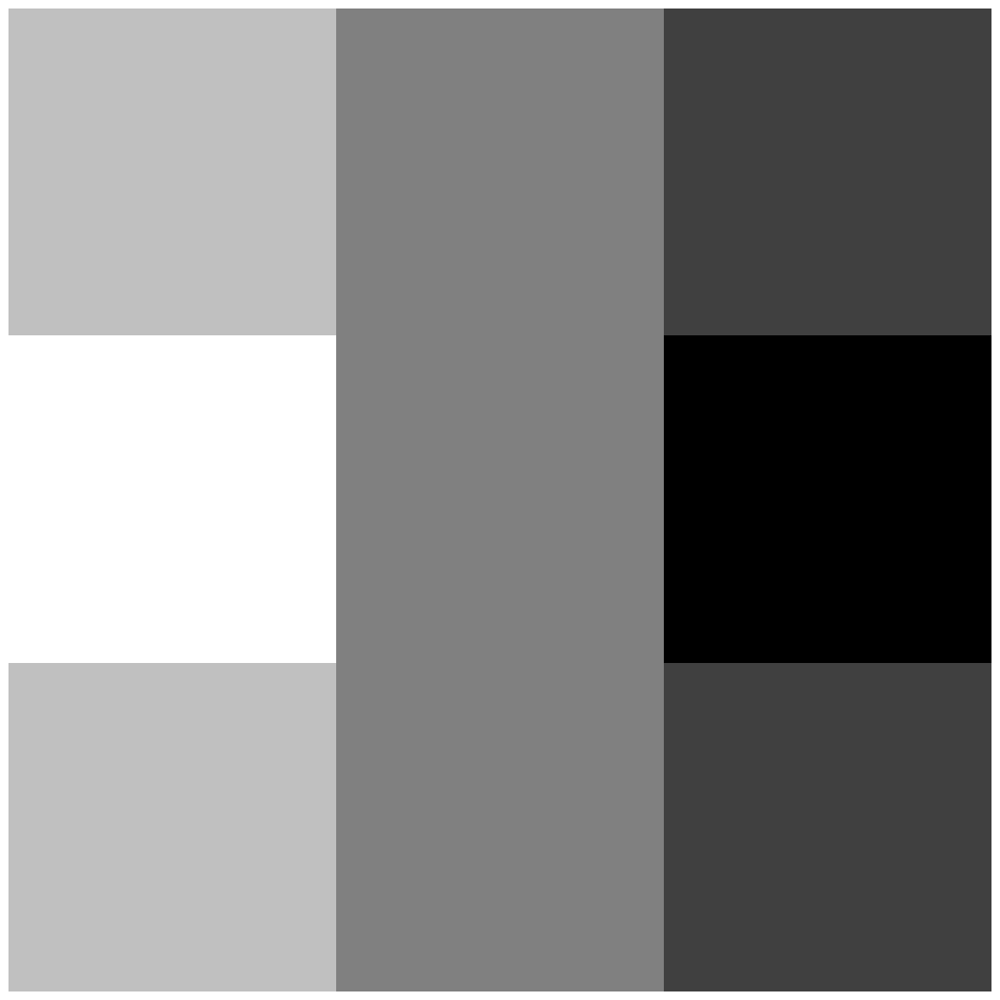

In [160]:
plot(a)

In [161]:
y = signal.convolve2d(image, a, mode='same')

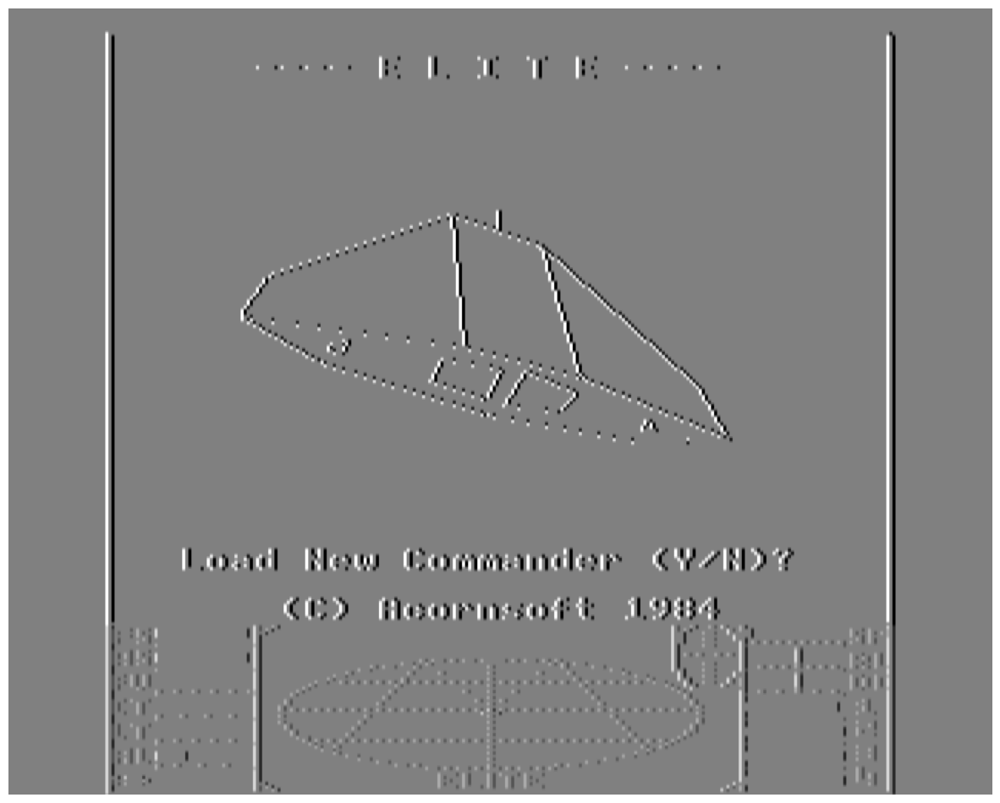

In [162]:
plot(y)

In [163]:
b = np.random.random((25,25)) #grabs random pixel from those spots

In [164]:
y = signal.convolve2d(image, b)

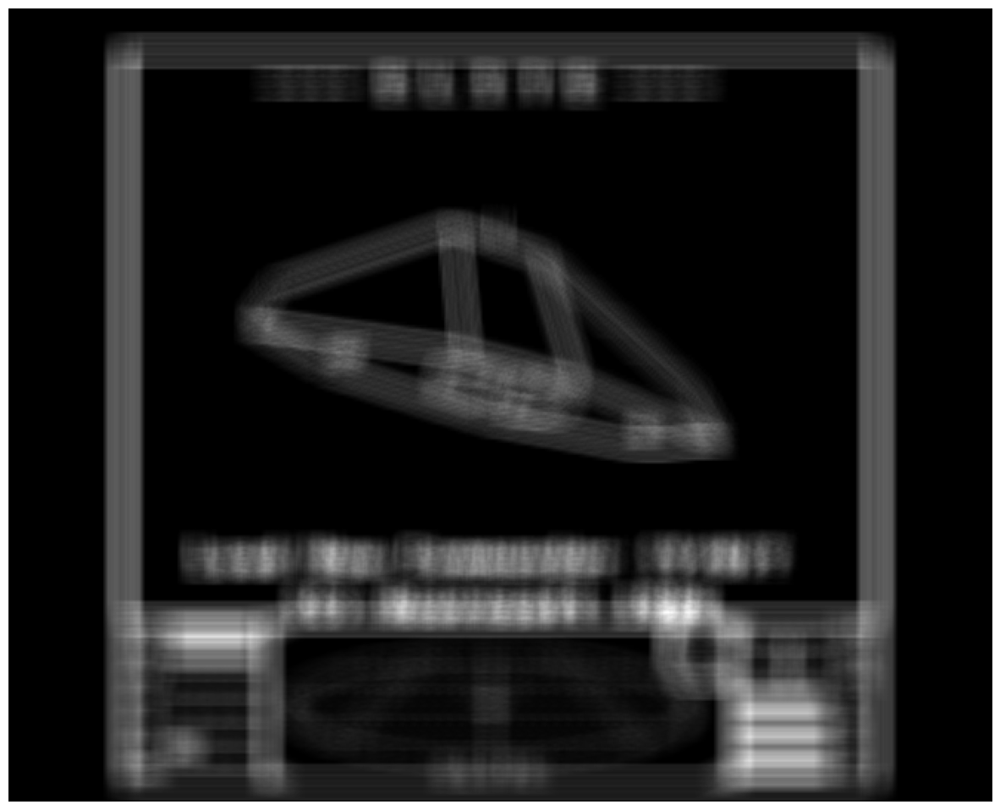

In [165]:
plot(y)

In [166]:
x = io.imread("https://ichef.bbci.co.uk/news/660/cpsprodpb/C342/production/_88068994_thinkstockphotos-493881770.jpg")
x = x[:,:,0]

In [167]:
x = x.astype(float) #converts the elements of x to the floating-point data type.

In [168]:
x

array([[100., 100., 100., ..., 168., 170., 164.],
       [100., 100., 100., ..., 169., 168., 168.],
       [101., 101., 101., ..., 170., 166., 169.],
       ...,
       [ 87.,  83.,  76., ...,  84., 125.,  74.],
       [ 52.,  64.,  77., ...,  71., 102.,  79.],
       [ 27.,  45.,  80., ...,  50.,  64.,  68.]])

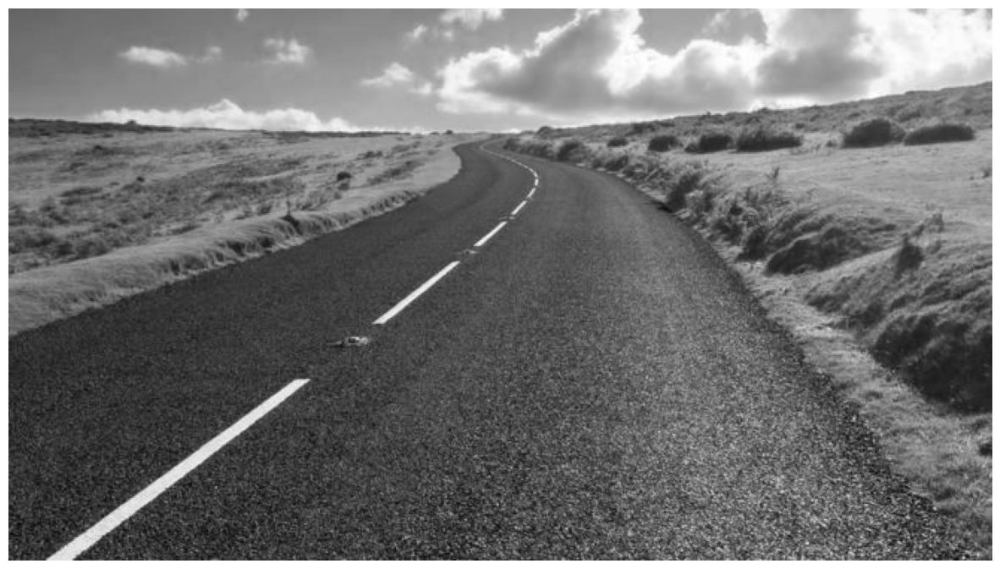

In [169]:
x = x / 255.0
plot(x)

In [170]:
x

array([[0.39215686, 0.39215686, 0.39215686, ..., 0.65882353, 0.66666667,
        0.64313725],
       [0.39215686, 0.39215686, 0.39215686, ..., 0.6627451 , 0.65882353,
        0.65882353],
       [0.39607843, 0.39607843, 0.39607843, ..., 0.66666667, 0.65098039,
        0.6627451 ],
       ...,
       [0.34117647, 0.3254902 , 0.29803922, ..., 0.32941176, 0.49019608,
        0.29019608],
       [0.20392157, 0.25098039, 0.30196078, ..., 0.27843137, 0.4       ,
        0.30980392],
       [0.10588235, 0.17647059, 0.31372549, ..., 0.19607843, 0.25098039,
        0.26666667]])

In [171]:
a

matrix([[ 1,  0, -1],
        [ 2,  0, -2],
        [ 1,  0, -1]])

In [172]:
a[1,1]

0

In [173]:
def conv2(x,f):
    x2 = np.zeros(x.shape)
    for i in range(1,x.shape[0]-1):
        for j in range(1,x.shape[1]-1):

            x2[i,j] = f[0,0] * x[i-1,j-1]  \
            +         f[0,1] * x[i-1,j]    \
            +         f[0,2] * x[i-1,j+1]  \
            +         f[1,0] * x[i,j-1]    \
            +         f[1,1] * x[i,j]      \
            +         f[1,2] * x[i,j+1]    \
            +         f[2,0] * x[i+1,j-1]  \
            +         f[2,1] * x[i+1,j]    \
            +         f[2,2] * x[i+1,j+1]

    return x2

In [174]:
a = np.matrix([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
# a = np.matrix([[1,2,1],[0,0,0],[-1,-2,-1]])
# a = np.matrix([[1,1,1],[1,1,1],[1,1,1]])
# a = 5*np.random.random((3,3))-5*np.random.random((3,3))

In [175]:
a

matrix([[-1, -1, -1],
        [-1,  8, -1],
        [-1, -1, -1]])

In [176]:
z = conv2(x,a) #the convolution operation is stored in the variable z

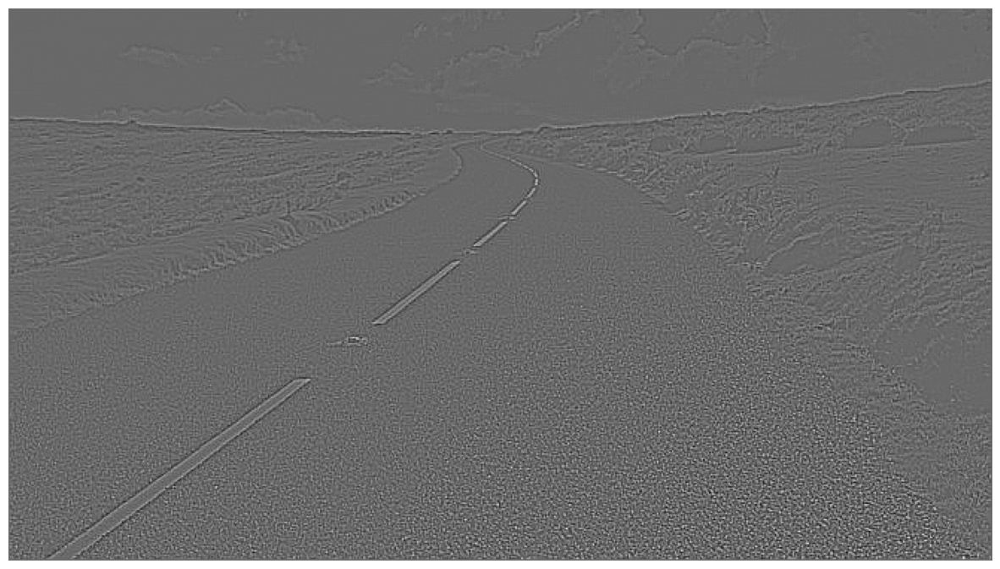

In [177]:
plot(z)

[[ 0.63407183 -0.20062764  0.73721961]
 [ 0.71400396 -0.91729859 -0.14892238]
 [-0.53288967 -0.20519007 -0.94316529]]


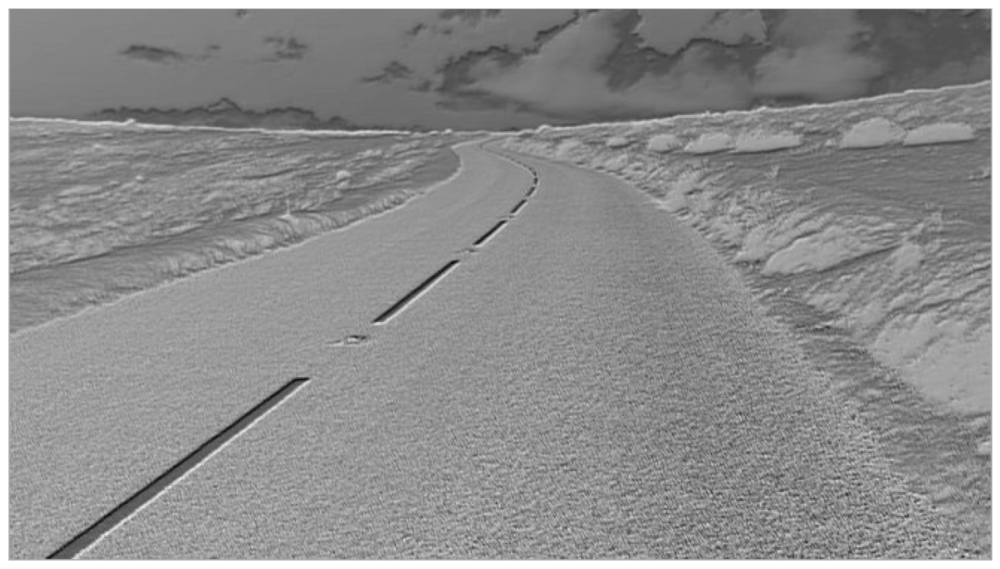

[[ 0.02578966 -0.48481932 -0.69558651]
 [-0.15803083  0.7189955  -0.46298789]
 [ 0.55883965  0.7310438  -0.76978759]]


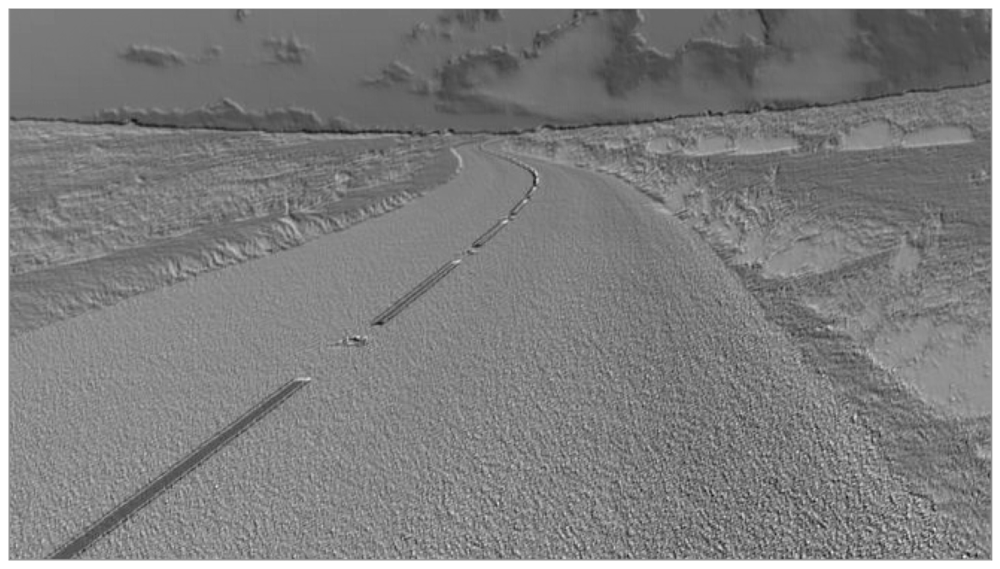

[[ 0.95066583  0.7125599  -0.58514746]
 [-0.50529644 -0.76188379  0.70742211]
 [ 0.37206239  0.65840054 -0.27142361]]


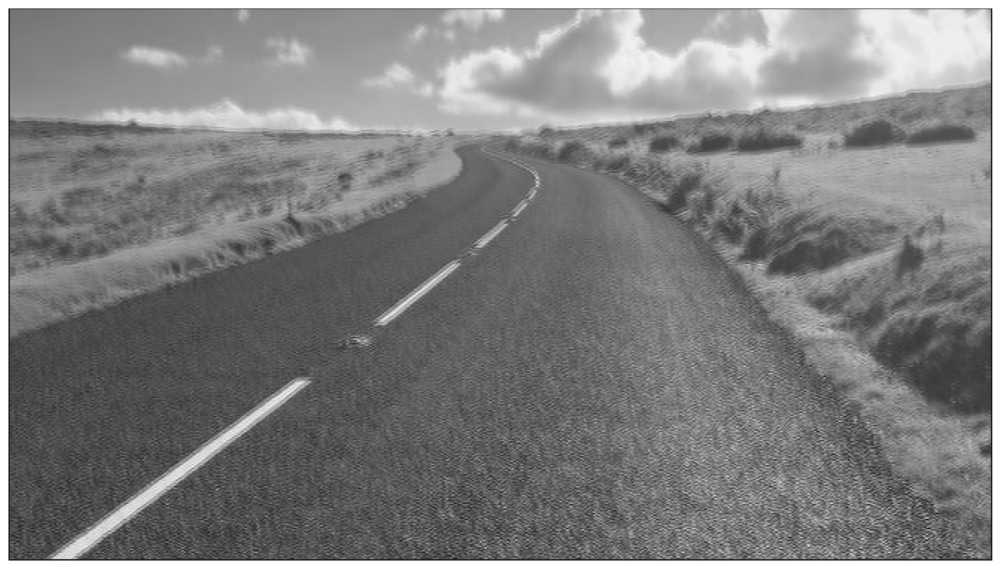

[[ 0.62037468 -0.50716823  0.40369723]
 [-0.0219993  -0.80030241 -0.82526332]
 [-0.61568296 -0.87997063  0.78887896]]


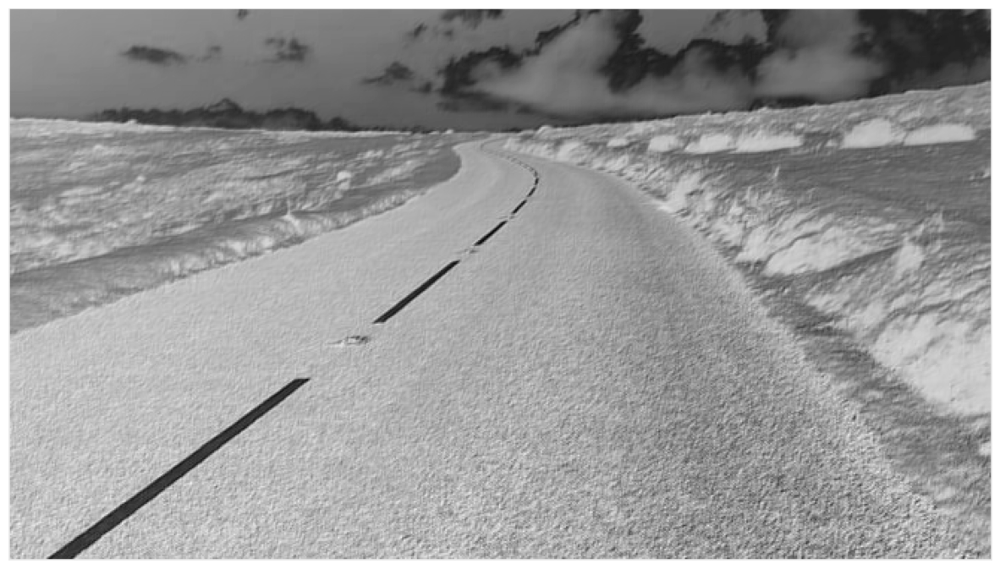

[[-0.90226365  0.07621566  0.60447746]
 [-0.75207718  0.30641057  0.14192697]
 [ 0.44325224  0.85261817  0.73567131]]


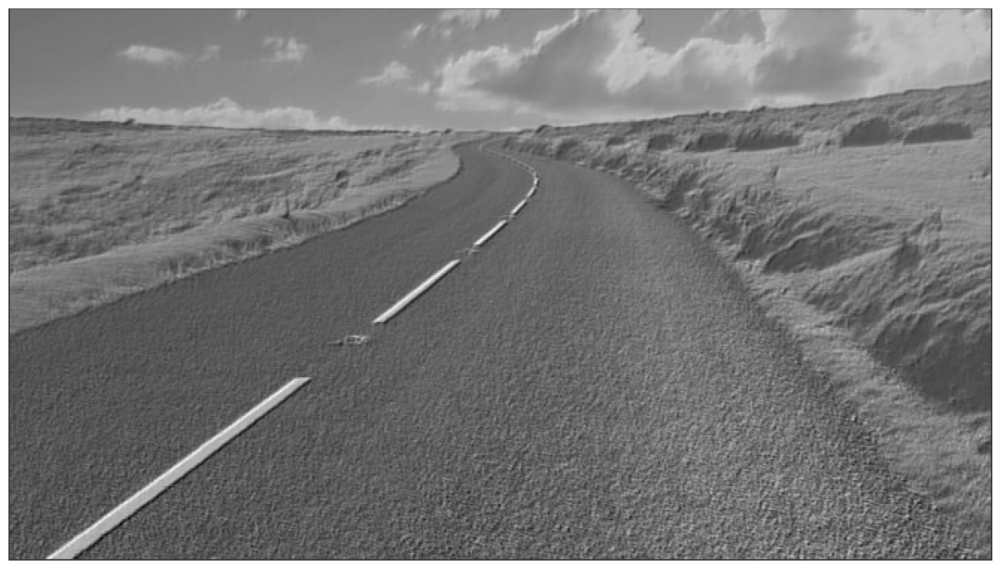

[[ 0.0392439   0.56997184 -0.47824903]
 [-0.31548744 -0.1781546  -0.49738911]
 [-0.54142839 -0.07013042 -0.82875061]]


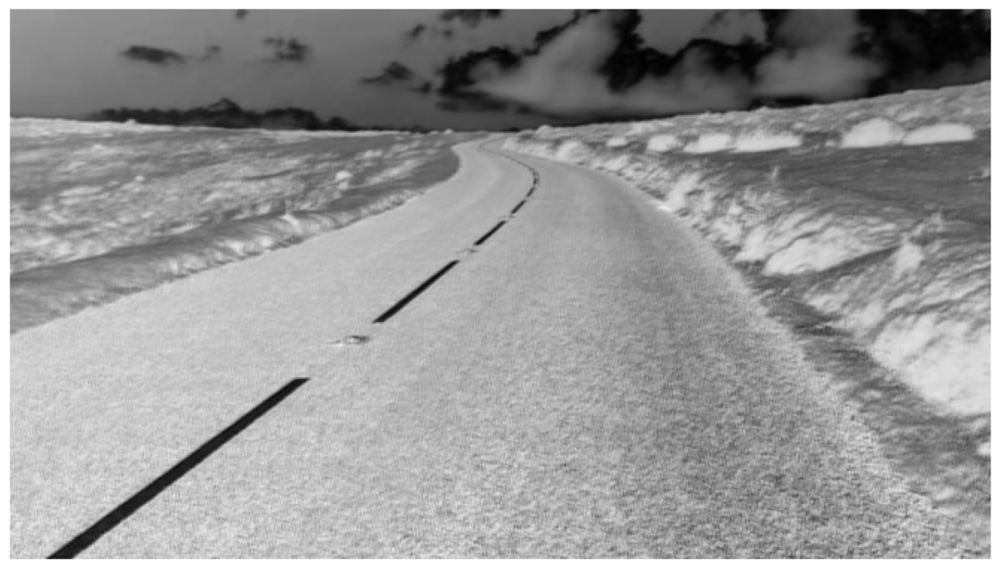

[[ 0.36816875  0.7896301   0.36903963]
 [ 0.38620555  0.35896667  0.19690089]
 [-0.67781827  0.88238179  0.40385005]]


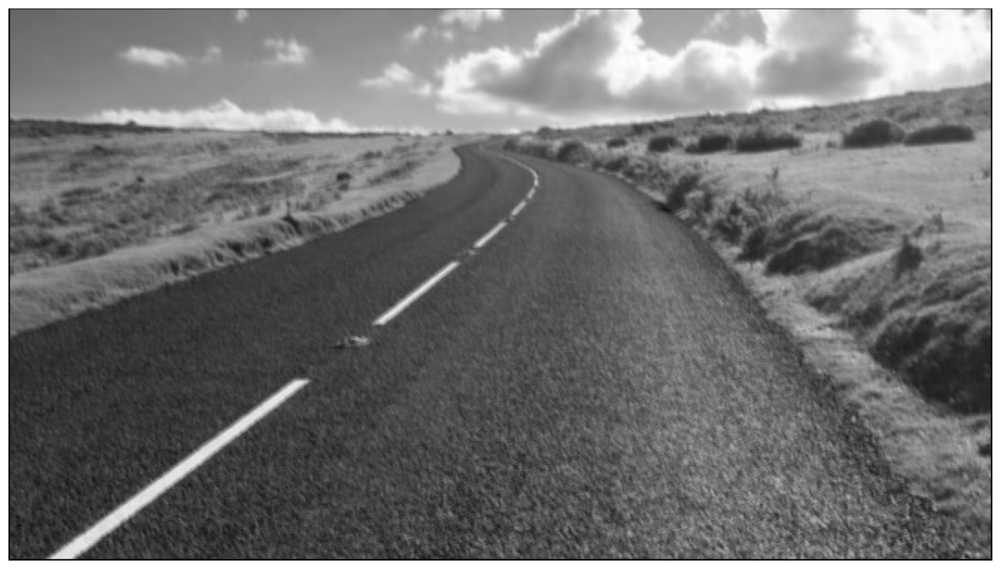

[[-0.31446882  0.72696485  0.15331054]
 [ 0.61177627 -0.38554829  0.33308198]
 [ 0.28775958  0.56045545  0.37817952]]


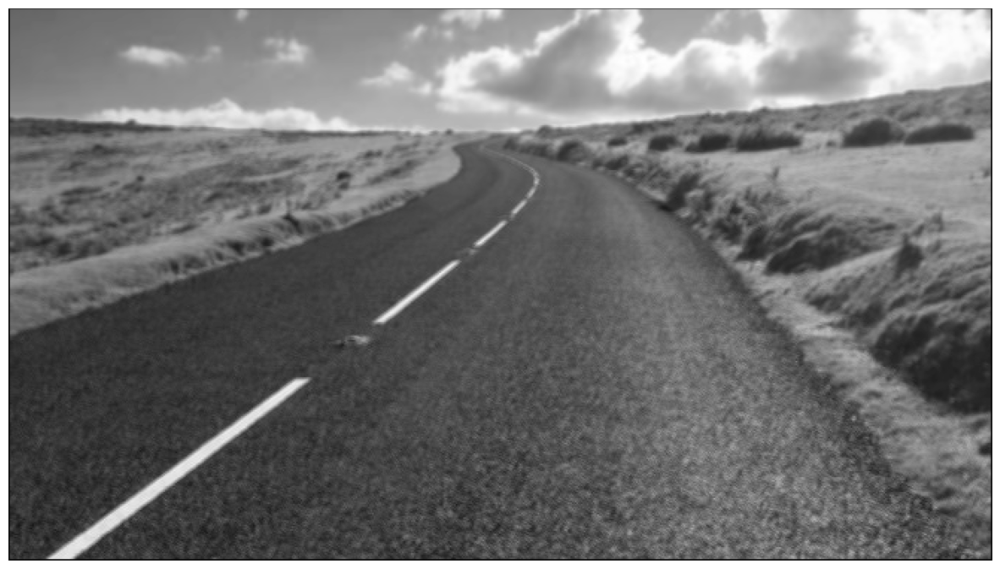

[[-0.47716653 -0.117198    0.86027786]
 [-0.82524815 -0.94056679 -0.69740493]
 [-0.61286993  0.92659984 -0.12887269]]


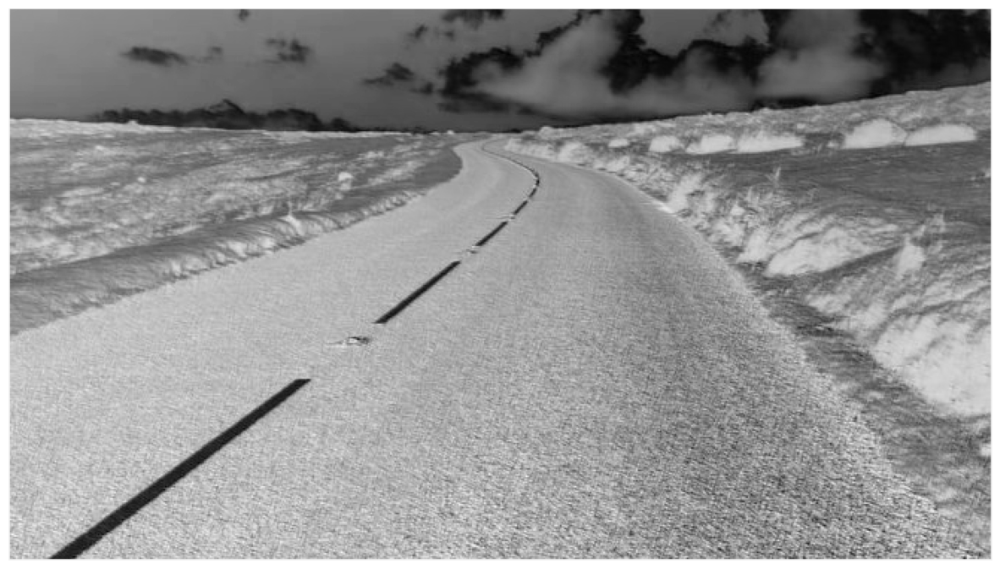

[[ 0.19019282 -0.59989608 -0.52969764]
 [ 0.12898692  0.65577913 -0.21116687]
 [-0.47851532 -0.69526155  0.72172874]]


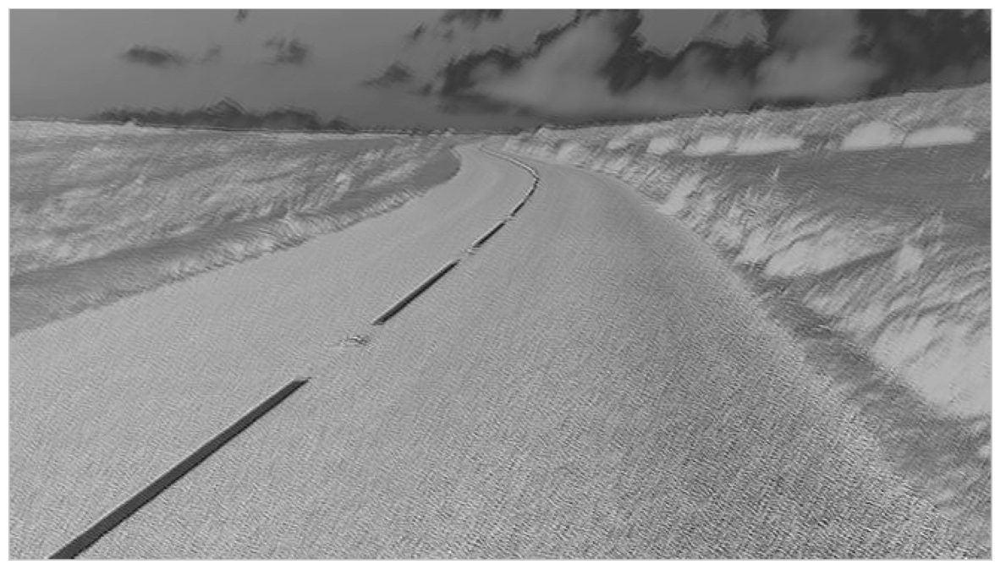

In [178]:
for i in range(10):
    a = 2*np.random.random((3,3))-1
    print(a)
    z=conv2(x,a)
    plot(z)

In [179]:
#Homemade Conv Loop Timing
a = 2*np.random.random((9,3,3))-1 #The values of the kernels are
#initialized randomly between -1 and 1.
start_time = time.time() #This line records the current time before starting the convolution loop
for i in range(9):

    z=conv2(x,a[i,:,:])

print("Seconds:", (time.time() - start_time)) #gives an indication of how long
#the convolution loop took to execute.

Seconds: 8.901015281677246


In [180]:
#Optimized Code Timing
a = 2*np.random.random((9,3,3))-1
start_time = time.time()
for i in range(9):

    z = signal.convolve2d(x,a[i,:,:]) #line is essentially equivalent to the
    #loop from earlier which is likely more optimized and faster than a
    # homemade convolution loop

print("--- %s seconds ---" % (time.time() - start_time))

--- 0.0903620719909668 seconds ---


In [181]:
#GPU Processing Timing, No Loop, 96 filters!!
a2 = 2*np.random.random((96,1,3,3))-1
x2 = torch.tensor(x).cuda() #This line converts the input x to a PyTorch tensor
#and moves it to the GPU (if available) using the .cuda() method.
a2 = torch.tensor(a2).cuda()
x2 = x2[None,None,:,:] #The resulting shape becomes (1, 1, height, width).

start_time = time.time()
z = conv2d(x2,a2)
print("--- %s seconds ---" % (time.time() - start_time))

--- 0.0006873607635498047 seconds ---


In [182]:
z.shape #gives dimensions

torch.Size([1, 96, 369, 658])

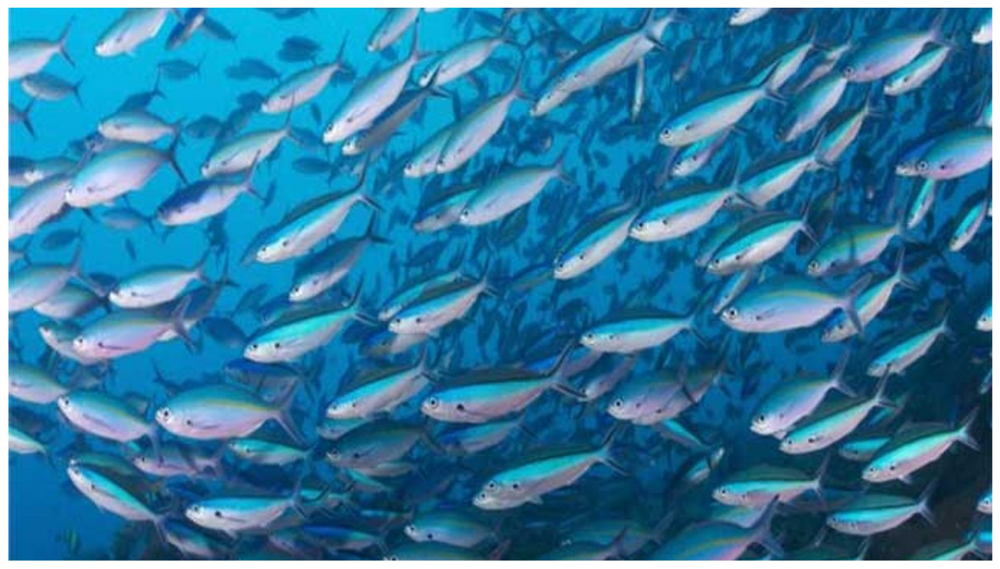

In [183]:
image = io.imread("https://img.jagranjosh.com/imported/images/E/Articles/Fastest-Fish-img.jpg").astype(float)/255.0
plot(image)

In [184]:
image.shape

(675, 1200, 3)

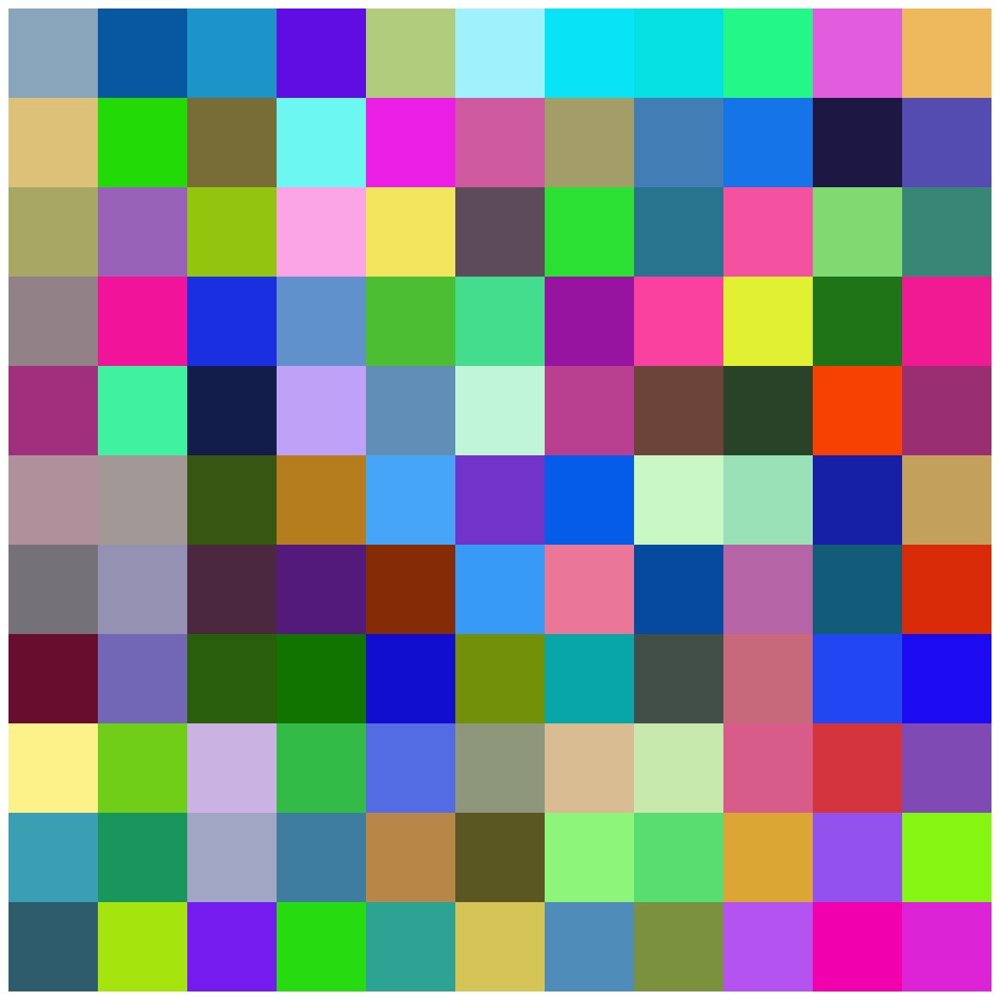

In [185]:
plot(np.random.random((11,11,3)))

In [186]:
image = np.transpose(image, (2, 0, 1))

In [187]:
image.shape

(3, 675, 1200)

In [188]:
f = np.random.random((1,3,11,11))

In [189]:
image.shape

(3, 675, 1200)

In [190]:
image = image[None,:,:,:] #none adds a new axis to the array

In [191]:
image.shape,f.shape

((1, 3, 675, 1200), (1, 3, 11, 11))

In [192]:
f =  torch.tensor(f)
image =  torch.tensor(image)

In [193]:
image2 = F.conv2d(image,f)

In [194]:
image2 = image2.numpy()

In [195]:
image2.shape

(1, 1, 665, 1190)

In [196]:
image2[0,0,:,:].shape

(665, 1190)

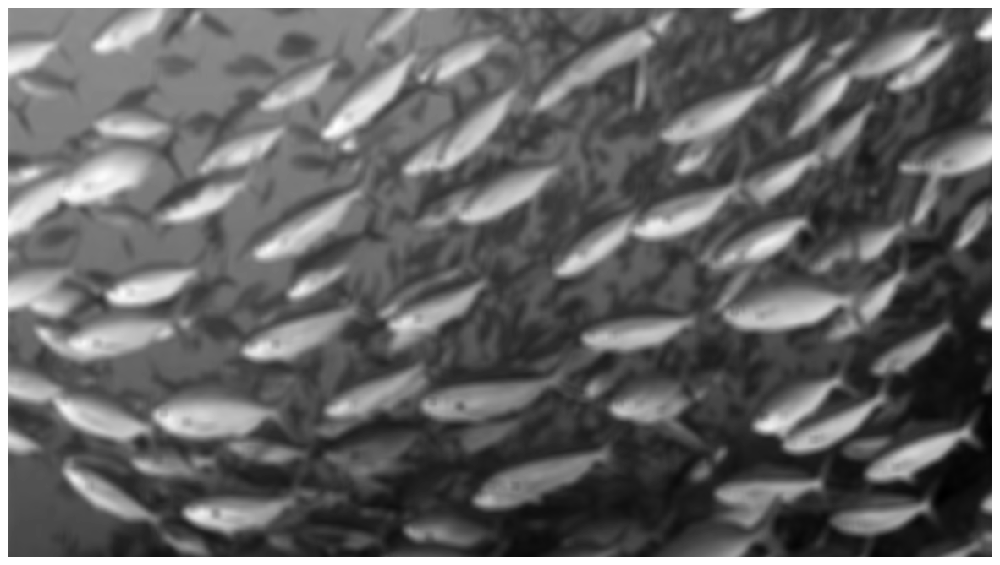

In [197]:
plot(image2[0,0,:,:])

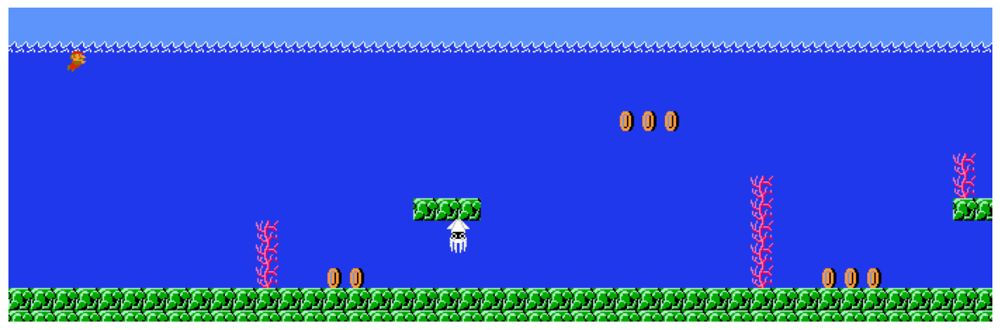

In [198]:
image = io.imread("http://ian-albert.com/games/super_mario_bros_maps/mario-2-2.gif")
image = image[:,0:700,:]
plot(image)

In [199]:
coin = image[185:200,224:239,:] #sets coin= to a specific part of the image

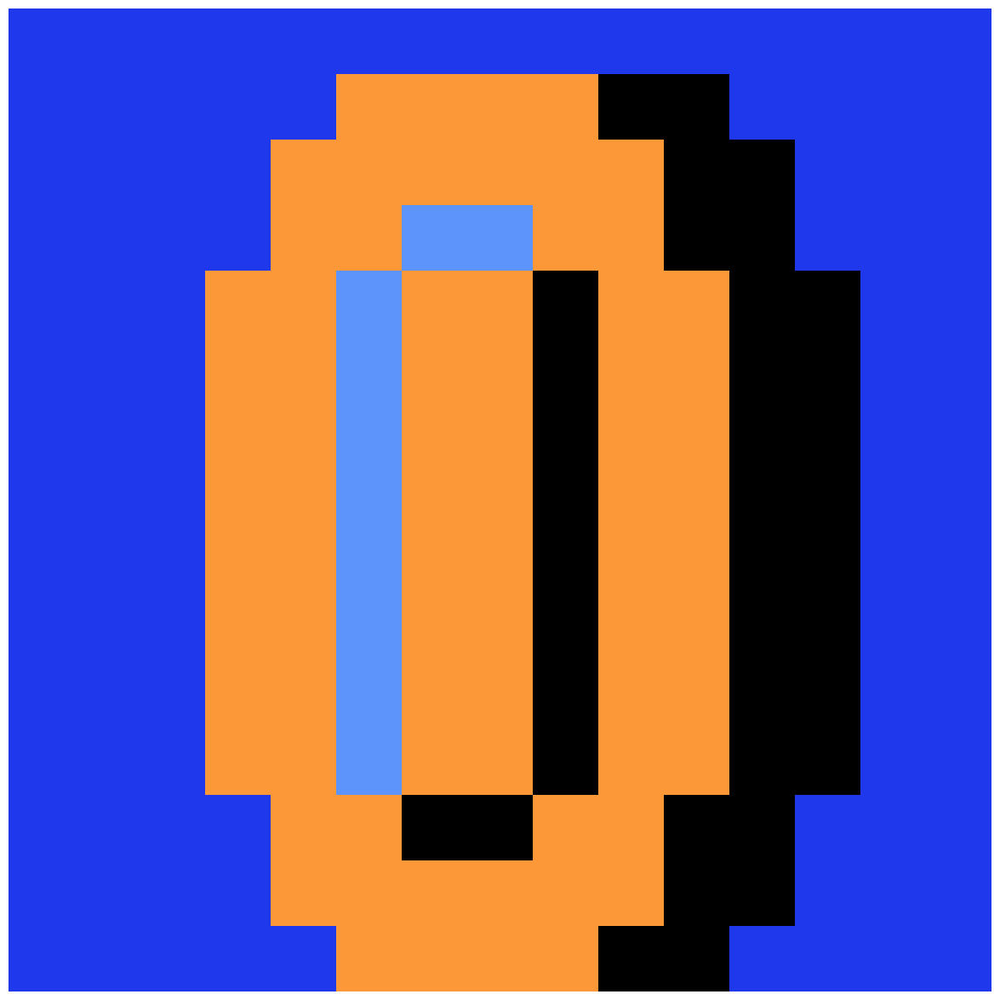

In [200]:
plot(coin)

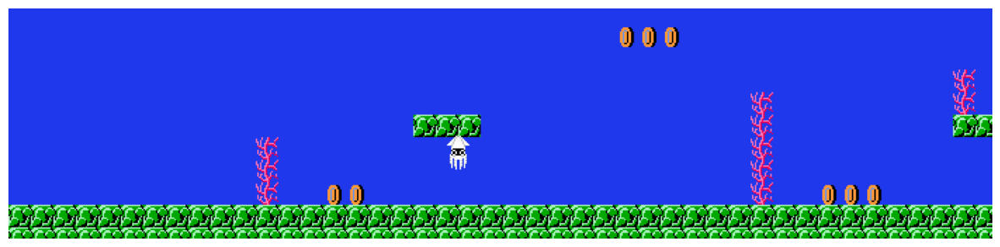

In [201]:
image = image[60:,0:700,:]
plot(image)

In [202]:
def scale1(x):
    return (x-np.min(x))/(np.max(x)-np.min(x))

In [203]:
image = np.mean(image,axis=2)
coin = np.mean(coin,axis=2)

image = scale1(image)
coin = scale1(coin)

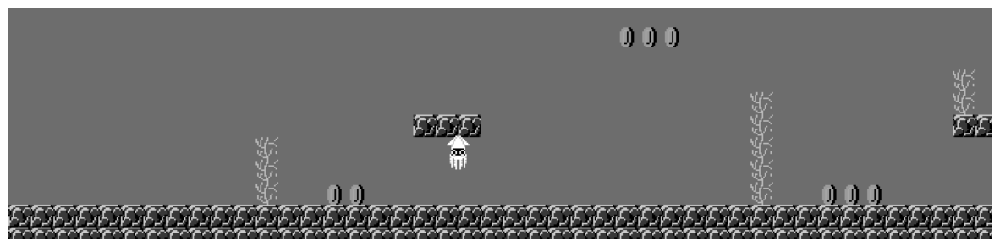

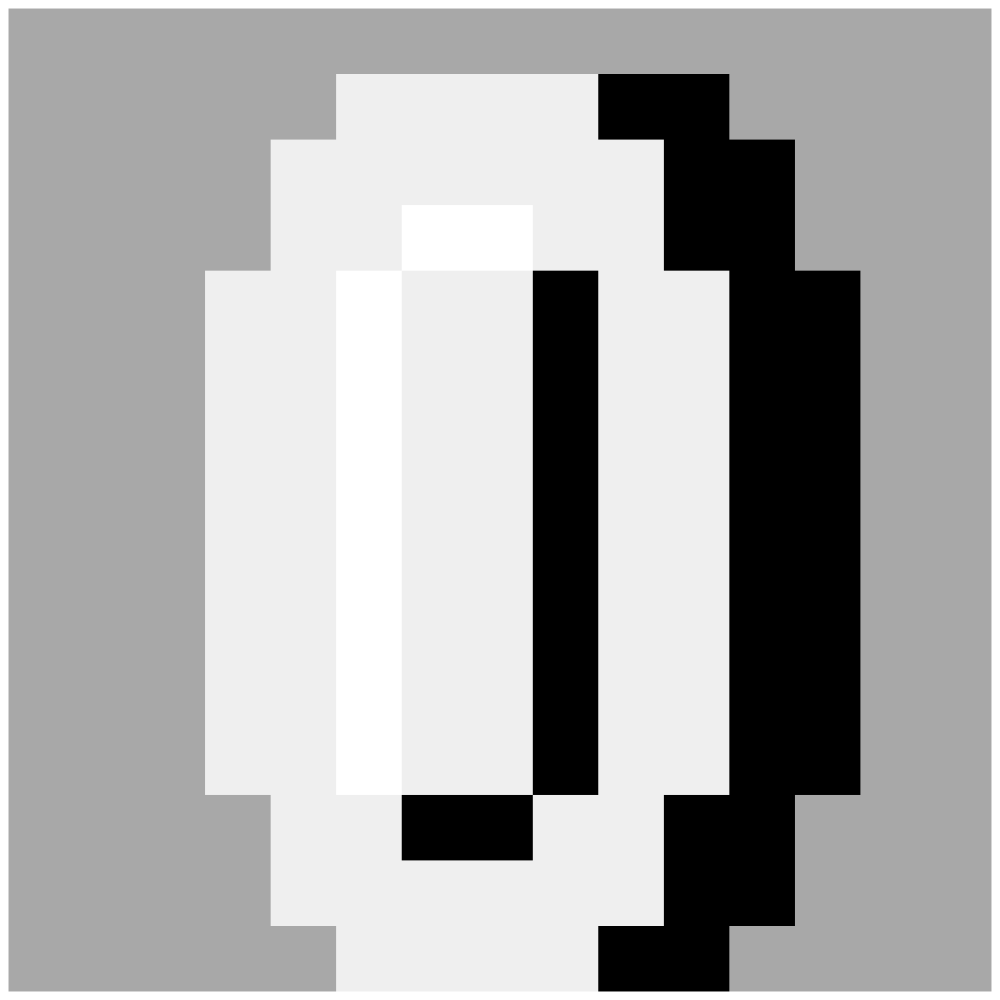

In [204]:
plot(image)
plot(coin)

In [205]:
coin.shape

(15, 15)

In [206]:
image = image - np.mean(image)
coin = coin - np.mean(coin)

In [207]:
image.shape,coin.shape

((164, 700), (15, 15))

In [208]:
coin = np.rot90(coin, 2)

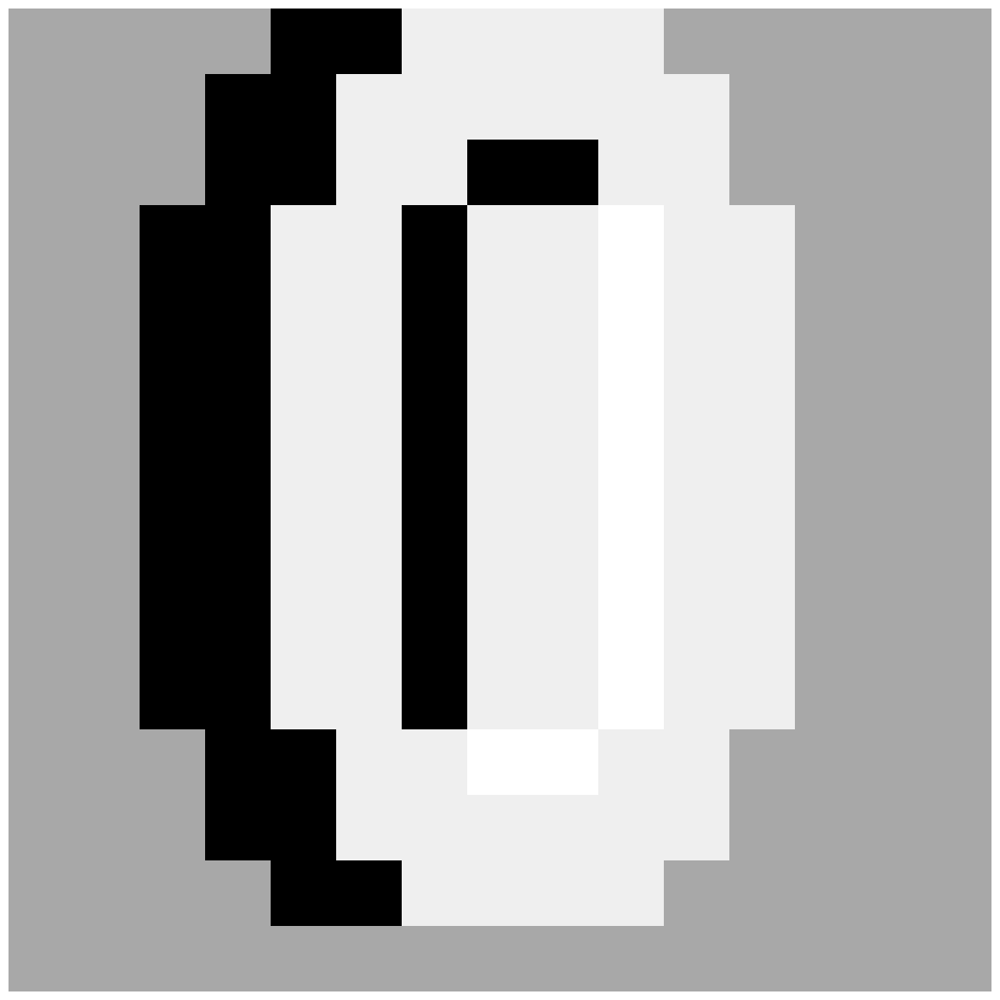

In [209]:
plot(coin)

In [210]:
z = signal.convolve2d(image,coin)

In [211]:
# z = conv2(image,coin)

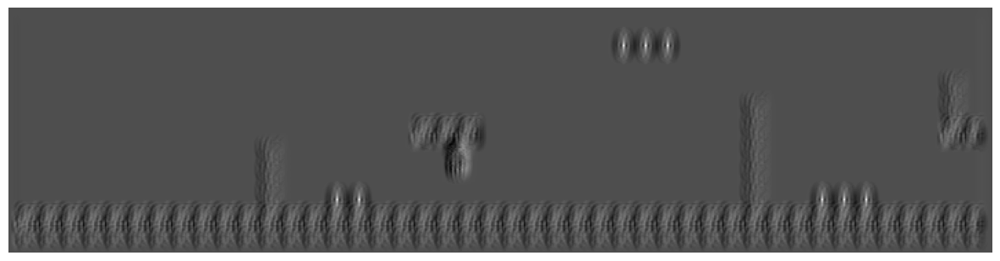

In [212]:
plot(z)

In [213]:
z == np.max(z)

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

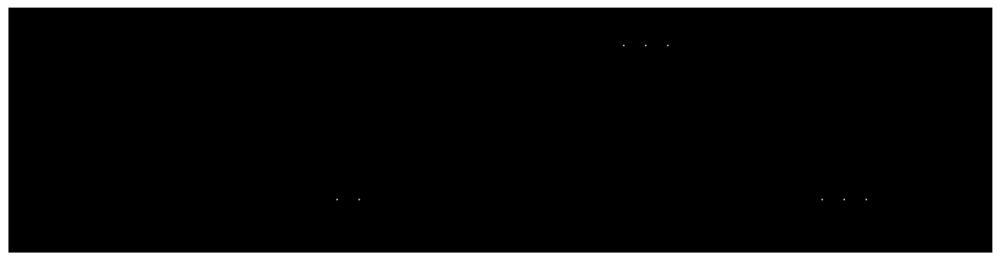

In [214]:
plot(z==np.max(z))

In [215]:
np.where(z == np.amax(z))

(array([ 27,  27,  27, 139, 139, 139, 139, 139]),
 array([446, 462, 478, 238, 254, 590, 606, 622]))

In [216]:
[y,x] = np.where(z == np.amax(z))

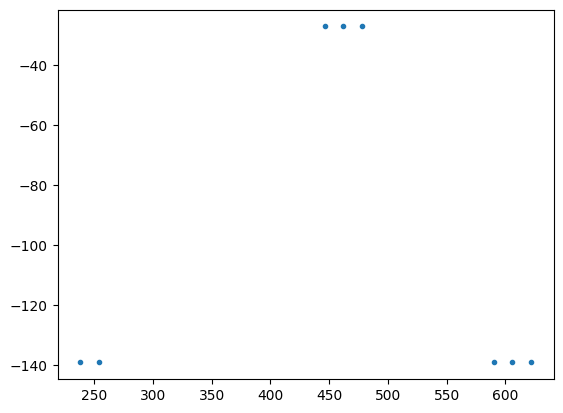

In [217]:
plt.plot(x,-y,'.')

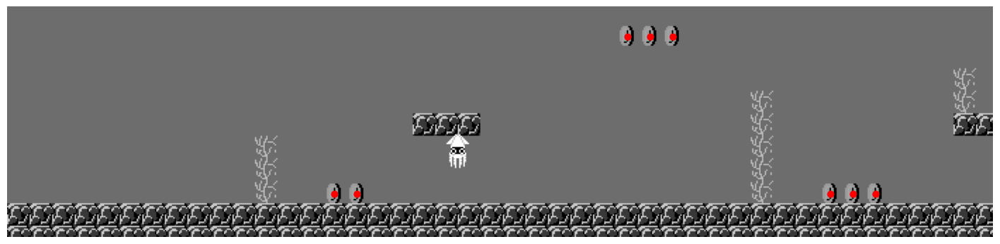

In [218]:
fig, ax = plt.subplots()
im = ax.imshow(image, cmap = 'gray')
ax.axis('off')
ax.scatter(x-6, y-6, c='red', s=40)
fig.set_size_inches(18, 10)

In [219]:
def conv2(w,f): #GPU conv with padding

    n = conv2d(w.type(torch.int),f.type(torch.int))
    n = pad(n, (1, 1, 1, 1)) #add ones to the sides of the matrix

    return n

In [220]:
#Game of Life

In [221]:
w = (np.random.random((100,100)) > 0.5) #game of life world grid w
f = np.matrix([[1,1,1],[1,0,1],[1,1,1]])

In [222]:
f

matrix([[1, 1, 1],
        [1, 0, 1],
        [1, 1, 1]])

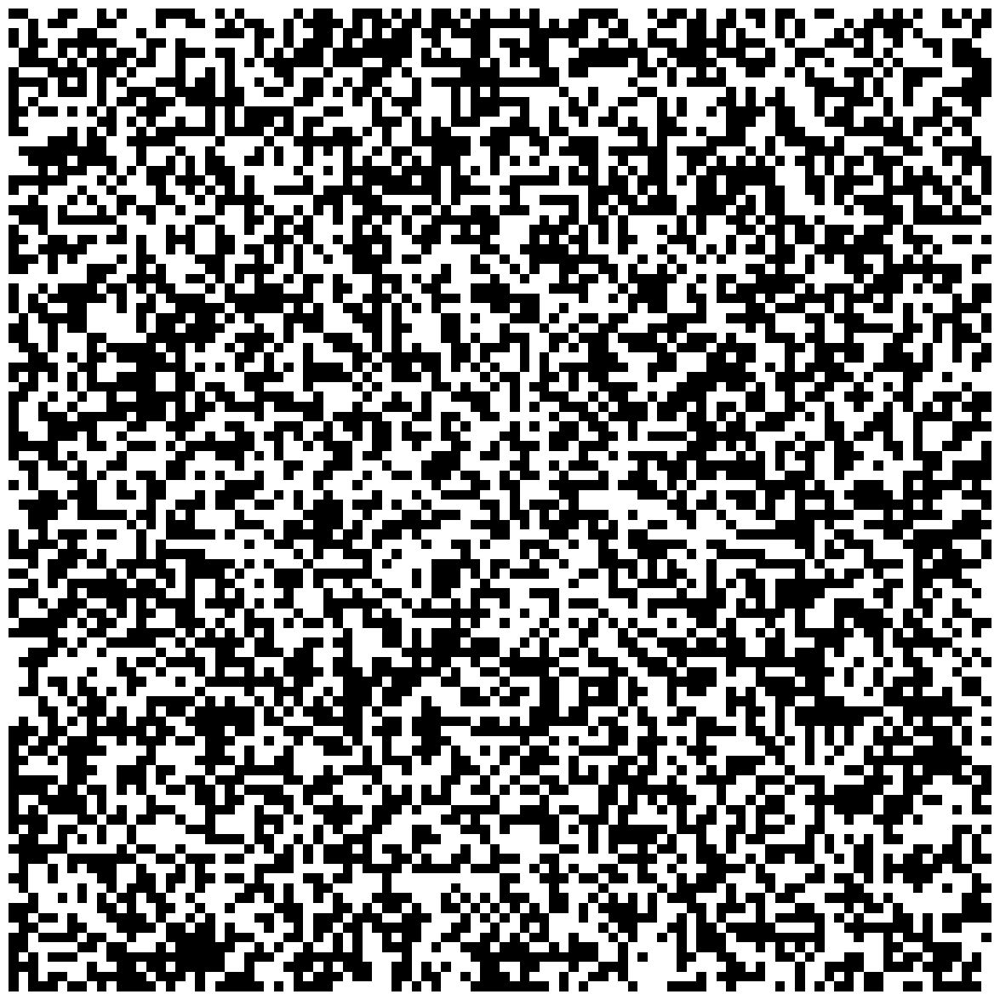

In [223]:
plot(w)

In [224]:
steps = 1000
A = torch.zeros((steps,100,100)) # storage for frames for animation
w = torch.tensor(w.astype(int))[None,None,:,:]
f = torch.tensor(f.astype(int))[None,None,:,:]

In [225]:
# %%timeit
n = conv2(w,f)

In [226]:
# (n==2)[0,0,:,:].shape

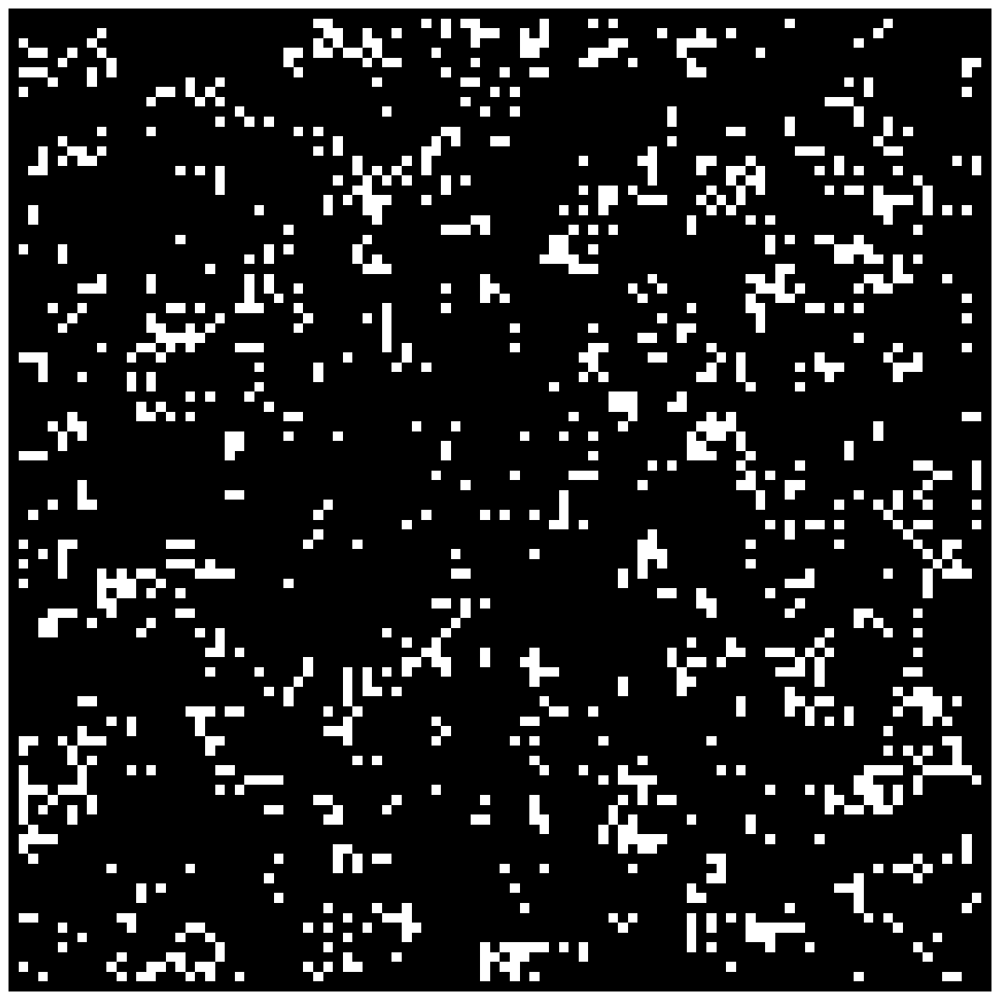

In [227]:
plot((n==2)[0,0,:,:])

In [228]:
for i in range(steps):

    n = conv2(w,f)

    w = (w * (n==2)) + (n==3)

    A[i] = w

In [ ]:
make_ani(A)

<ipython-input-139-55783c28ecbf>:17: UserWarning: frames=<function make_ani.<locals>.step at 0x7fb8c18fd990> which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  return animation.FuncAnimation(fig, animate, step, interval=100, repeat=True, fargs=(im,))


In [ ]:
#Surface Tension Model

In [ ]:
w = (np.random.random((100,100)) > 0.5).astype(int)
f = np.matrix([[1,1,1],[1,1,1],[1,1,1]])

In [ ]:
steps = 200
A = torch.zeros((steps,100,100)) # storage for frames for animation
w = torch.tensor(w)[None,None,:,:]
f = torch.tensor(f)[None,None,:,:]

In [ ]:
for i in range(steps):

    n = conv2(w,f)

    w = ~((n<4) + (n==5))

    A[i] = w

In [ ]:
make_ani(A)

In [ ]:
#Forest Fire Model

In [ ]:
# veg = {empty=0 burning=1 green=2}

In [ ]:
Plightning = 0.00005
Pgrowth = 0.01

w = (np.random.random((100,100)) > 0.5).astype(int)
f = np.matrix([[1,1,1],[1,0,1],[1,1,1]])

steps = 1000
A = torch.zeros((steps,100,100)) # storage for frames for animation
w = torch.tensor(w)[None,None,:,:]
f = torch.tensor(f)[None,None,:,:]

In [ ]:
for i in range(steps):

    n = w == 1

    n = conv2(n,f)

    w =  2*((w == 2)).type(torch.int)                                                \
    -    1*((w == 2) * ( n > 0 ) ).type(torch.int)                                   \
    -    1*((w == 2) * ( np.random.random((100,100)) < Plightning)).type(torch.int)  \
    +    2*((w == 0) * ( np.random.random((100,100)) < Pgrowth)).type(torch.int)

    A[i] = w

In [ ]:
make_ani(A, colormap='magma')

In [ ]:
#Nonlinear Waves

In [ ]:
w = np.random.random((100,100)) < 0.1
f = np.matrix([[1,1,1],[1,0,1],[1,1,1]])

t  = 6  #center value=6; 7 makes fast pattern; 5 analiating waves
t1 = 3  #center value=3

steps = 1000
A = torch.zeros((steps,100,100)) # storage for frames for animation
w = torch.from_numpy(w)[None,None,:,:]
f = torch.from_numpy(f)[None,None,:,:]

In [ ]:
for i in range(1000):

    n = (w>0)&(w<t)

    n = conv2(n,f)

    w = ((w==0) & (n>=t1)) \
    +  2*(w==1)            \
    +  3*(w==2)            \
    +  4*(w==3)            \
    +  5*(w==4)            \
    +  6*(w==5)            \
    +  7*(w==6)            \
    +  8*(w==7)            \
    +  9*(w==8)            \
    +  0*(w==9)            \

    A[i] = w

In [ ]:
make_ani(A)

In [ ]:
#Wireword Wire
#{empty=0 electron_head=1 electron_tail=2, wire=3}

In [ ]:
w = np.zeros((100,100))
w[50,:] = 3
w[50,5] = 2
w[50,6] = 1

f = np.matrix([[1,1,1],[1,0,1],[1,1,1]])

steps = 1000
A = torch.zeros((steps,100,100)) # storage for frames for animation
w = torch.from_numpy(w)[None,None,:,:]
f = torch.from_numpy(f)[None,None,:,:]

In [ ]:
for i in range(100):

    n=w==1

    n = conv2(n,f)

    w = 1*((w==3)& ((n==1) | (n==2)))                 \
    +   3*((w==3)& ((n!=1) & (n!=2)))                 \
    +   0*(w==0)                    \
    +   2*(w==1)                    \
    +   3*(w==2)                    \

    A[i] = w

In [ ]:
make_ani(A, colormap='magma')

In [ ]:
#Wireworld Oscillator

In [ ]:
w = np.zeros((100,100))
w[50,15:-1] = 3
w[48,5:15] = 3
w[52,5:15] = 3
w[49:52,4] = 3
w[49:52,15] = 3
w[52,14] = 1
w[52,13] = 2

f = np.matrix([[1,1,1],[1,0,1],[1,1,1]])

steps = 1000
A = torch.zeros((steps,100,100)) # storage for frames for animation
w = torch.from_numpy(w)[None,None,:,:]
f = torch.from_numpy(f)[None,None,:,:]

In [ ]:
for i in range(steps):

    n = w == 1

    n = conv2(n,f)

    w = 0*((w==0))                                    \
    +   2*((w==1))                                    \
    +   3*((w==2))                                    \
    +   3*((w==3)& ((n!=1) & (n!=2)))                 \
    +   1*((w==3)& ((n==1) | (n==2)))                 \

    A[i] = w

In [ ]:
make_ani(A, colormap='magma')

In [ ]:
#FitzHugh-Nagumo Reaction Diffusion

In [ ]:
def laplacian(U):
    n = conv2d(U,laplace)
    n = pad(n, (1, 1, 1, 1),'circular')
    return n

In [ ]:
laplace = 0.5*np.array([[0.5, 1.0, 0.5],
                        [1.0, -6., 1.0],
                        [0.5, 1.0, 0.5]])

In [ ]:
N = 256
h = 0.05

A = np.zeros([N, N], dtype=np.float32)

A = A + -0.7

noise_shape = A[:,120:130].shape

A[:,120:130] = (np.random.normal(0.9,0.05,size=noise_shape))

B = np.zeros([N, N], dtype=np.float32)

B = B + -0.3

In [ ]:
w1 = plot(A)

In [ ]:
a0 = -0.1
a1 = 2
epsilon = 0.05
delta = 4
k1 = 1
k2 = 0
k3 = 1

In [ ]:
A = torch.from_numpy(A)[None,None,:,:].cuda()
B = torch.from_numpy(B)[None,None,:,:].cuda()
laplace = torch.from_numpy(laplace)[None,None,:,:].type(torch.float).cuda()

In [ ]:
steps = 100
P = torch.zeros((steps,N,N)) # storage for frames for animation

In [ ]:
j = 0
for i in range(steps*1000):

    A += h*( k1*A - k2*A**2 - A**3 - B + laplacian(A))
    B += h*( epsilon*(k3*A - a1*B -a0) + delta*laplacian(B) )

    if i % 1000 == 0:
        P[j] = A
        j += 1

In [ ]:
make_ani(P)

In [ ]:
#Gray Scott Reaction Diffusion

In [ ]:
laplace = 0.5*np.array([[0.5, 1.0, 0.5],
                        [1.0, -6., 1.0],
                        [0.5, 1.0, 0.5]])

In [ ]:
laplace = torch.from_numpy(laplace)[None,None,:,:].type(torch.float).cuda()

In [ ]:
def laplacian(U):
    n = conv2d(U,laplace)
    n = pad(n, (1,1,1,1))
    n = pad(n, (0,0,0,0))
    return n

In [ ]:
(Du, Dv, F, k) = ((0.16, 0.08, 0.035, 0.065)) # Bacteria 1
# (Du, Dv, F, k) = ((0.14, 0.06, 0.035, 0.065)) # Bacteria 2
# (Du, Dv, F, k) = ((0.16, 0.08, 0.060, 0.062)) # Coral
# (Du, Dv, F, k) = ((0.19, 0.05, 0.060, 0.062)) # Fingerprint
# (Du, Dv, F, k) = ((0.10, 0.10, 0.018, 0.050)) # Spirals
# (Du, Dv, F, k) = ((0.12, 0.08, 0.020, 0.050)) # Spirals Dense
# (Du, Dv, F, k) = ((0.10, 0.16, 0.020, 0.050)) # Spirals Fast
# (Du, Dv, F, k) = ((0.16, 0.08, 0.020, 0.055)) # Unstable
# (Du, Dv, F, k) = ((0.16, 0.08, 0.050, 0.065)) # Worms 1
# (Du, Dv, F, k) = ((0.16, 0.08, 0.054, 0.063)) # Worms 2
# (Du, Dv, F, k) = ((0.16, 0.08, 0.035, 0.060)) # Zebrafish

N = 256

U = np.zeros((N,N)) # Clear Chemicals
V = np.zeros((N,N))

U = U + 1.0
r = 5
U[N//2-r:N//2+r,N//2-r:N//2+r] = 0.50 # Add Disturbance in Center Square Radius r
V[N//2-r:N//2+r,N//2-r:N//2+r] = 0.25

U += 0.05*np.random.random((N,N)) # Add Noise to Chemicals
V += 0.05*np.random.random((N,N))

U = torch.from_numpy(U)[None,None,:,:].type(torch.float).cuda()
V = torch.from_numpy(V)[None,None,:,:].type(torch.float).cuda()

steps = 2000
skip = 100
P = torch.zeros((steps,N,N)) # storage for frames for animation

In [ ]:
j = 0
for i in range(steps*skip):

    U += ( Du*laplacian(U) - U*V**2 +  F   *(1-U) )
    V += ( Dv*laplacian(V) + U*V**2 - (F+k)*V     )

    if i % skip == 0:
        P[j] = U
        j += 1

In [ ]:
make_ani(P)

In [ ]:
# (Du, Dv, F, k) = ((0.16, 0.08, 0.035, 0.065)) # Bacteria 1
# (Du, Dv, F, k) = ((0.14, 0.06, 0.035, 0.065)) # Bacteria 2
# (Du, Dv, F, k) = ((0.16, 0.08, 0.060, 0.062)) # Coral
# (Du, Dv, F, k) = ((0.19, 0.05, 0.060, 0.062)) # Fingerprint
# (Du, Dv, F, k) = ((0.10, 0.10, 0.018, 0.050)) # Spirals
# (Du, Dv, F, k) = ((0.12, 0.08, 0.020, 0.050)) # Spirals Dense
# (Du, Dv, F, k) = ((0.10, 0.16, 0.020, 0.050)) # Spirals Fast
# (Du, Dv, F, k) = ((0.16, 0.08, 0.020, 0.055)) # Unstable
# (Du, Dv, F, k) = ((0.16, 0.08, 0.050, 0.065)) # Worms 1
# (Du, Dv, F, k) = ((0.16, 0.08, 0.054, 0.063)) # Worms 2
(Du, Dv, F, k) = ((0.16, 0.08, 0.035, 0.060)) # Zebrafish

N = 256

U = np.zeros((N,N)) # Clear Chemicals
V = np.zeros((N,N))

U = U + 1.0
r = 5
U[N//2-r:N//2+r,N//2-r:N//2+r] = 0.50 # Add Disturbance in Center Square Radius r
V[N//2-r:N//2+r,N//2-r:N//2+r] = 0.25

U += 0.05*np.random.random((N,N)) # Add Noise to Chemicals
V += 0.05*np.random.random((N,N))

U = torch.from_numpy(U)[None,None,:,:].type(torch.float).cuda()
V = torch.from_numpy(V)[None,None,:,:].type(torch.float).cuda()

steps = 2000
skip = 100
P = torch.zeros((steps,N,N)) # storage for frames for animation

In [ ]:
j = 0
for i in range(steps*skip):

    U += ( Du*laplacian(U) - U*V**2 +  F   *(1-U) )
    V += ( Dv*laplacian(V) + U*V**2 - (F+k)*V     )

    if i % skip == 0:
        P[j] = U
        j += 1

In [ ]:
make_ani(P)

In [ ]:
# (Du, Dv, F, k) = ((0.16, 0.08, 0.035, 0.065)) # Bacteria 1
# (Du, Dv, F, k) = ((0.14, 0.06, 0.035, 0.065)) # Bacteria 2
(Du, Dv, F, k) = ((0.16, 0.08, 0.060, 0.062)) # Coral
# (Du, Dv, F, k) = ((0.19, 0.05, 0.060, 0.062)) # Fingerprint
# (Du, Dv, F, k) = ((0.10, 0.10, 0.018, 0.050)) # Spirals
# (Du, Dv, F, k) = ((0.12, 0.08, 0.020, 0.050)) # Spirals Dense
# (Du, Dv, F, k) = ((0.10, 0.16, 0.020, 0.050)) # Spirals Fast
# (Du, Dv, F, k) = ((0.16, 0.08, 0.020, 0.055)) # Unstable
# (Du, Dv, F, k) = ((0.16, 0.08, 0.050, 0.065)) # Worms 1
# (Du, Dv, F, k) = ((0.16, 0.08, 0.054, 0.063)) # Worms 2
# (Du, Dv, F, k) = ((0.16, 0.08, 0.035, 0.060)) # Zebrafish

N = 256

U = np.zeros((N,N)) # Clear Chemicals
V = np.zeros((N,N))

U = U + 1.0
r = 5
U[N//2-r:N//2+r,N//2-r:N//2+r] = 0.50 # Add Disturbance in Center Square Radius r
V[N//2-r:N//2+r,N//2-r:N//2+r] = 0.25

U += 0.05*np.random.random((N,N)) # Add Noise to Chemicals
V += 0.05*np.random.random((N,N))

U = torch.from_numpy(U)[None,None,:,:].type(torch.float).cuda()
V = torch.from_numpy(V)[None,None,:,:].type(torch.float).cuda()

steps = 8000
skip = 100
P = torch.zeros((steps,N,N)) # storage for frames for animation

In [ ]:
j = 0
for i in range(steps*skip):

    U += ( Du*laplacian(U) - U*V**2 +  F   *(1-U) )
    V += ( Dv*laplacian(V) + U*V**2 - (F+k)*V     )

    if i % skip == 0:
        P[j] = U
        j += 1

In [ ]:
make_ani(P)